## Graph tool

In [2]:
!echo "deb http://downloads.skewed.de/apt jammy main" >> /etc/apt/sources.list
!apt-key adv --keyserver keyserver.ubuntu.com --recv-key 612DEFB798507F25
!apt-get update
!apt-get install python3-graph-tool python3-matplotlib python3-cairo

Executing: /tmp/apt-key-gpghome.OycSYOHpVj/gpg.1.sh --keyserver keyserver.ubuntu.com --recv-key 612DEFB798507F25
gpg: key 612DEFB798507F25: public key "Tiago de Paula Peixoto <tiago@skewed.de>" imported
gpg: Total number processed: 1
gpg:               imported: 1
Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Get:5 http://downloads.skewed.de/apt jammy InRelease [7,536 B]
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Get:7 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease [18.1 kB]
Get:8 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [109 kB]
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:10 http://downloads.skewed.de/apt jammy/main a

In [3]:
# Colab uses a Python install that deviates from the system's! Bad collab! We need some workarounds.
!apt purge python3-cairo
!apt install libcairo2-dev pkg-config python3-dev
!pip install --force-reinstall pycairo
!pip install zstandard

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following packages will be REMOVED:
  python3-cairo*
0 upgraded, 0 newly installed, 1 to remove and 19 not upgraded.
After this operation, 310 kB disk space will be freed.
(Reading database ... 129246 files and directories currently installed.)
Removing python3-cairo:amd64 (1.20.1-3build1) ...
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
pkg-config is already the newest version (0.29.2-1ubuntu3).
python3-dev is already the newest version (3.10.6-1~22.04).
python3-dev set to manually installed.
The following additional packages will be installed:
  libblkid-dev libcairo-script-interpreter2 libffi-dev libglib2.0-dev libglib2.0-dev-bin libice-dev
  liblzo2-2 libmount-dev libpixman-1-dev libselinux1-dev libsepol-dev libsm-dev libxcb-render0-dev
  libxcb-shm0-dev
Suggested packages:
  libcairo2-doc libgirepository1.0-dev libglib2.0-doc libg

In [4]:
import graph_tool.all as gt
import matplotlib.pyplot as plt
import numpy as np
import matplotlib
import random

### example of loading a pre-defined graph

In [66]:
g = gt.collection.ns["us_roads/DC"]

### basic numbers

In [67]:
print(g)

<Graph object, undirected, with 9559 vertices and 14909 edges, 3 internal vertex properties, 3 internal edge properties, 5 internal graph properties, at 0x7bd7893a64d0>


In [68]:
g.list_properties()

name              (graph)   (type: string, val: us_roads (DC))
description       (graph)   (type: string, val: The road networks of the 50 US
                                                States and the District of
                                                Columbia based on UA Census
                                                2000 TIGER/Line Files.  Edges
                                                are stretches of road and
                                                vertices are intersections of
                                                roads. The data sets were
                                                assembled by Dominik Schultes.
                                                The 'merged' network contains
                                                all the states merged together.)
citation          (graph)   (type: string, val: ['9th DIMACS Implementation
                                                Challenge - Shortest Paths, htt
         

### in- and out-degree distribution

In [69]:
total_hist = gt.vertex_hist(g, "total")

In [70]:
num_total_nodes = sum(count for total_degree, count in enumerate(total_hist[0]) if total_degree > 0)

print(f"Number of total-nodes: {num_total_nodes}")


Number of total-nodes: 9559.0


In [71]:
total_hist[1][:-1]

array([0, 1, 2, 3, 4, 5, 6], dtype=uint64)

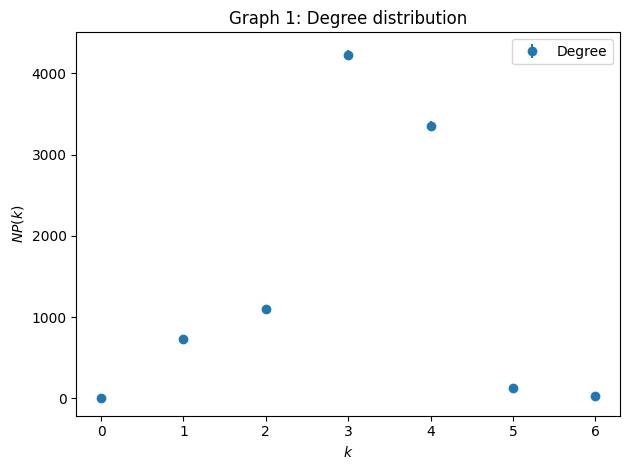

In [72]:
y = total_hist[0]
err = np.sqrt(total_hist[0])
plt.errorbar(total_hist[1][:-1], total_hist[0], fmt="o", yerr=err,
        label="Degree")


plt.xlabel("$k$")
plt.ylabel("$NP(k)$")
plt.title("Graph 1: Degree distribution")

plt.tight_layout()
plt.legend()

### select a subgraph for visualization

In [73]:
u = gt.extract_largest_component(g)

print(u)

u = gt.Graph(u, prune=True)

print(u)

<GraphView object, undirected, with 9522 vertices and 14875 edges, 3 internal vertex properties, 3 internal edge properties, 5 internal graph properties, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x7bd787e24a30, at 0x7bd787e25810>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x7bd787e24a30, at 0x7bd787e25690>, False), at 0x7bd787e24a30>
<Graph object, undirected, with 9522 vertices and 14875 edges, 3 internal vertex properties, 3 internal edge properties, 5 internal graph properties, at 0x7bd787e24ac0>


### spring layout

In [74]:
pos = gt.sfdp_layout(u)

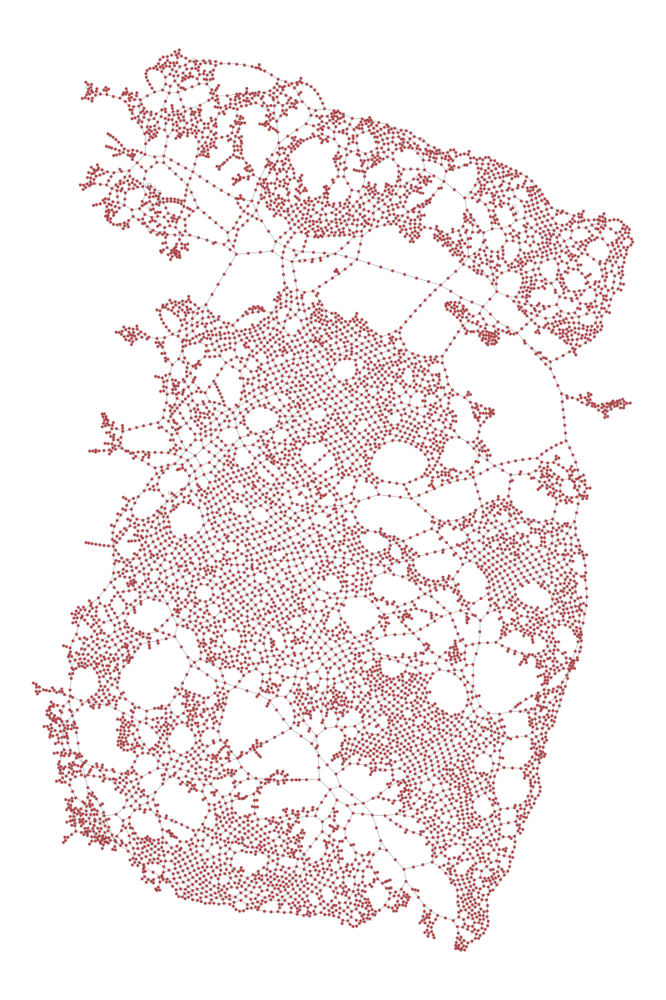

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7bd787e24ac0, at 0x7bd787df2230>

In [75]:
gt.graph_draw(u, pos)

In [76]:
pos_fr = gt.fruchterman_reingold_layout(u, n_iter=10)

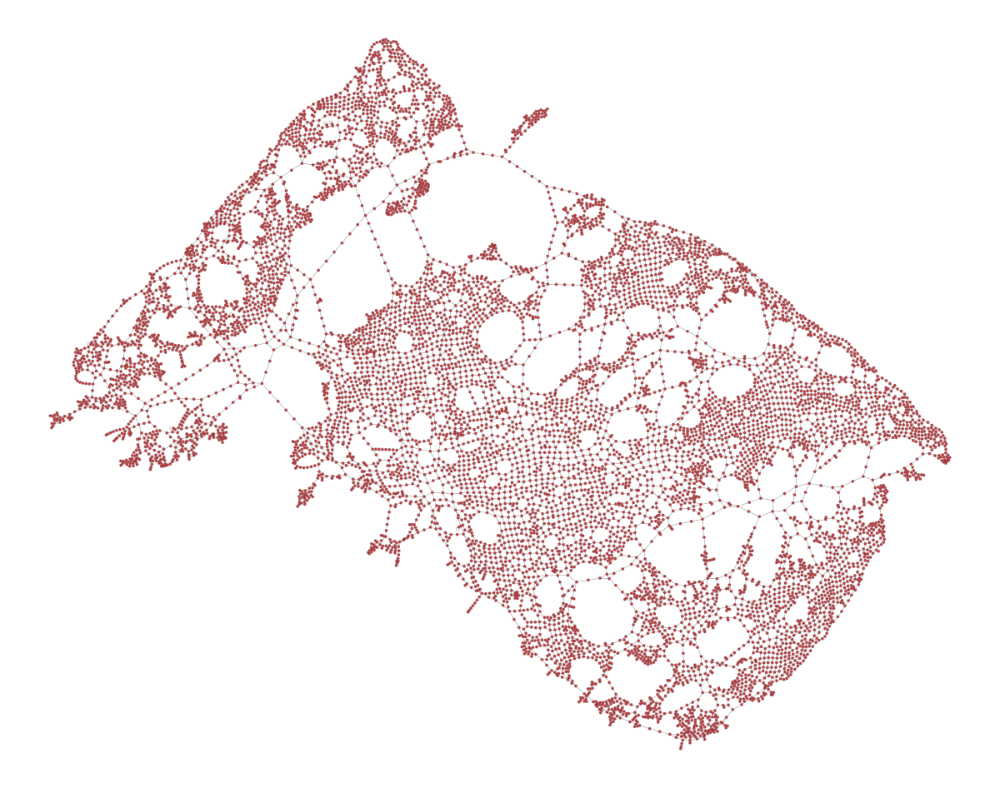

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7bd787e24ac0, at 0x7bd787e24d90>

In [78]:
gt.graph_draw(u, pos=u.vp["_pos"])

In [79]:
import geopandas as gpd

countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

<ipython-input-79-104005221799>:3: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))


In [82]:
maximum = max(u.get_total_degrees(u.get_vertices()))

print(np.where(u.get_total_degrees(u.get_vertices()) == maximum))
print(u.get_total_degrees(u.get_vertices()))

(array([ 375,  788,  827, 1120, 1320, 1647, 2094, 2420, 2580, 2609, 2760,
       2816, 3119, 3257, 3722, 3757, 4629, 4685, 5598, 5965, 6617, 6803,
       6841, 6997, 7019, 7108, 7158, 7623]),)
[1 3 1 ... 2 3 3]


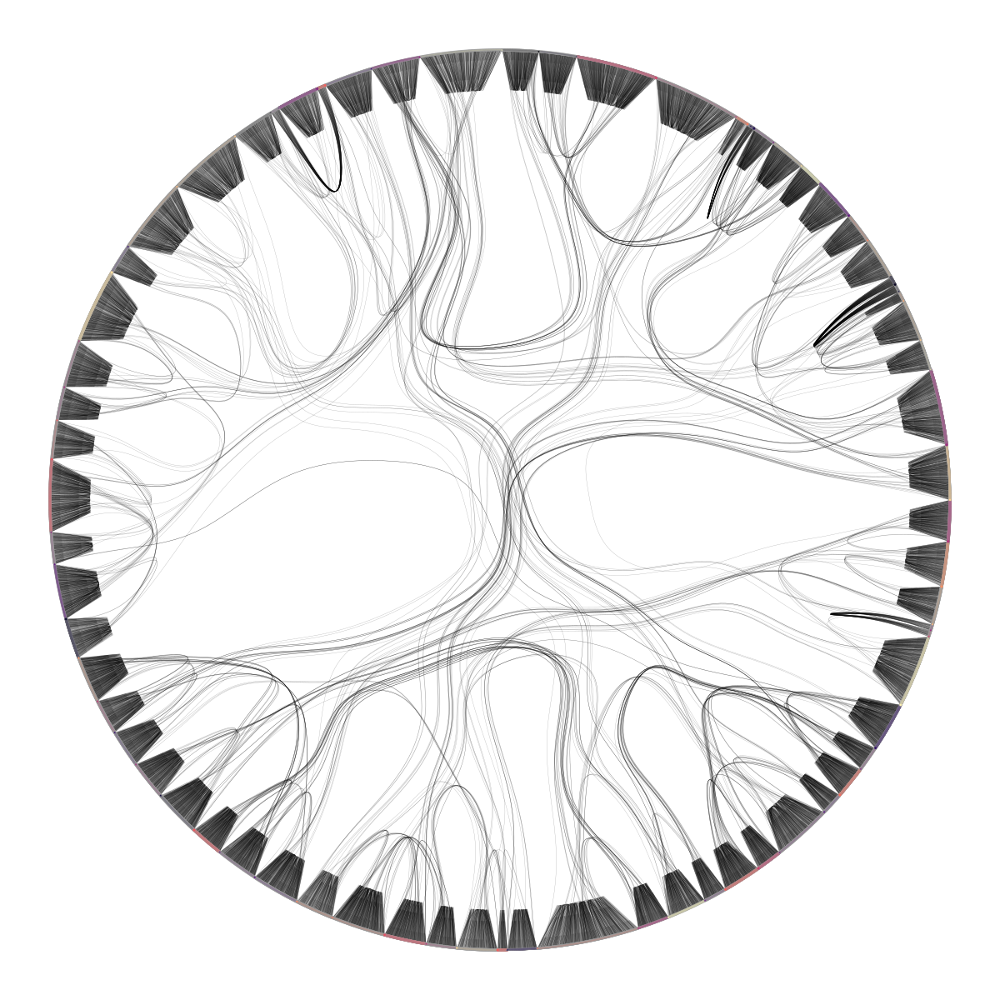

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7bd787e24ac0, at 0x7bd789412110>

In [85]:
state = gt.minimize_nested_blockmodel_dl(u)

t = gt.get_hierarchy_tree(state)[0]

tpos = pos = gt.radial_tree_layout(t, t.vertex(t.num_vertices() - 1, use_index=False), weighted=True)

cts = gt.get_hierarchy_control_points(u, t, tpos)

pos = u.own_property(tpos)

b = state.levels[0].b

shape = b.copy()

shape.a %= 14

gt.graph_draw(u, pos=pos, vertex_fill_color=b, vertex_shape=shape, edge_control_points=cts,

              edge_color=[0, 0, 0, 0.3], vertex_anchor=0)

### k-core decomposition

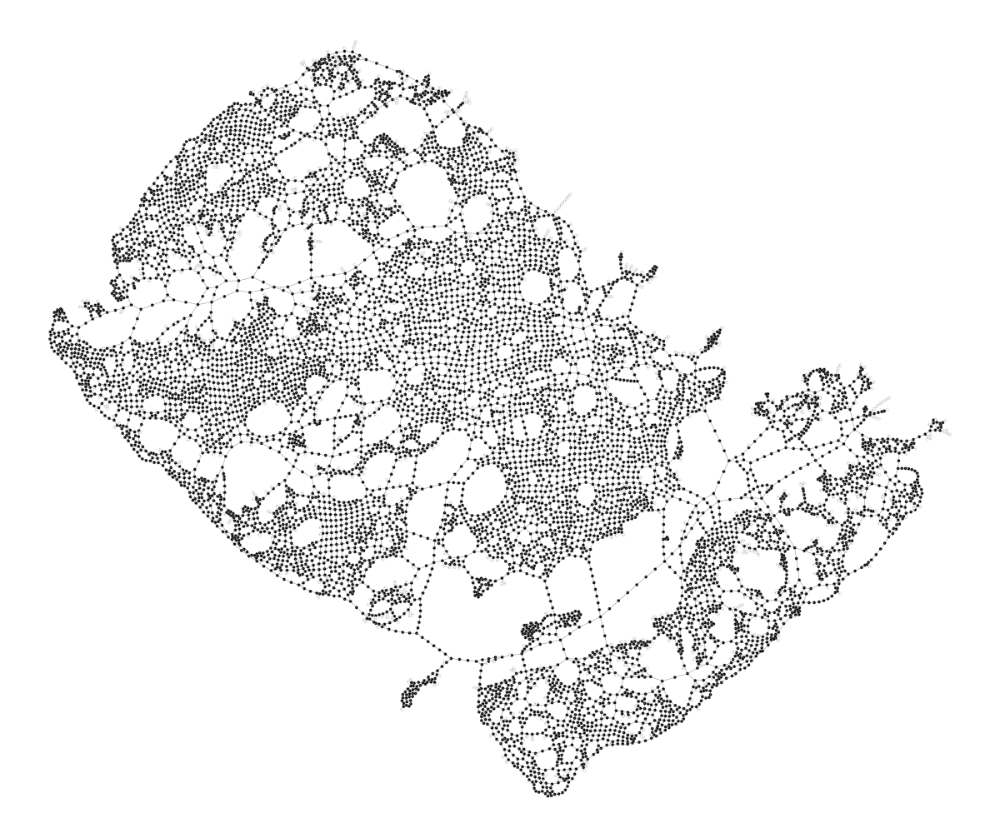

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7bd787e24ac0, at 0x7bd7895149a0>

In [90]:
#u = gt.GraphView(u, vfilt=gt.label_largest_component(u))
kcore = gt.kcore_decomposition(u)
gt.graph_draw(u, vertex_fill_color=kcore, vertex_text=kcore)

### shortest paths

[ 1  0  1 ... 64 86 84]


Text(0, 0.5, '$Frequency$')

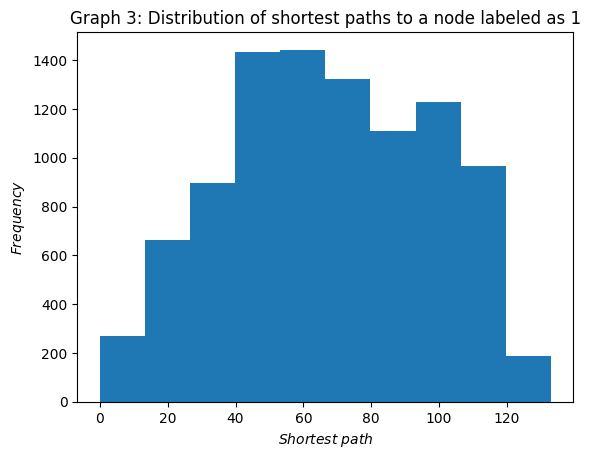

In [94]:
dist = gt.shortest_distance(u, source=u.vertex(1)) #vertice 1

print(dist.a)

plt.hist(dist.a)
plt.title("Graph 3: Distribution of shortest paths to a node labeled as 1")
plt.xlabel("$Shortest$ $path$")
plt.ylabel("$Frequency$")

[0.000000e+00 2.961400e+04 5.761800e+04 8.910800e+04 1.222480e+05
 1.567740e+05 1.927620e+05 2.293900e+05 2.667540e+05 3.053720e+05
 3.443500e+05 3.836520e+05 4.224340e+05 4.604520e+05 4.988520e+05
 5.369400e+05 5.745660e+05 6.123240e+05 6.506740e+05 6.894580e+05
 7.279560e+05 7.663980e+05 8.048560e+05 8.434100e+05 8.815420e+05
 9.196900e+05 9.567340e+05 9.921120e+05 1.025636e+06 1.056162e+06
 1.084208e+06 1.111536e+06 1.138454e+06 1.163322e+06 1.187468e+06
 1.210156e+06 1.230826e+06 1.246744e+06 1.258984e+06 1.270320e+06
 1.281114e+06 1.289520e+06 1.294764e+06 1.295572e+06 1.295534e+06
 1.293864e+06 1.288576e+06 1.281828e+06 1.273798e+06 1.265016e+06
 1.253736e+06 1.239468e+06 1.224382e+06 1.208684e+06 1.192320e+06
 1.174320e+06 1.154536e+06 1.134068e+06 1.113142e+06 1.091570e+06
 1.070536e+06 1.050980e+06 1.032264e+06 1.011906e+06 9.922900e+05
 9.728980e+05 9.551260e+05 9.389420e+05 9.233580e+05 9.089720e+05
 8.966140e+05 8.840940e+05 8.707060e+05 8.565300e+05 8.422220e+05
 8.275940e

Text(0, 0.5, '$Frequency$')

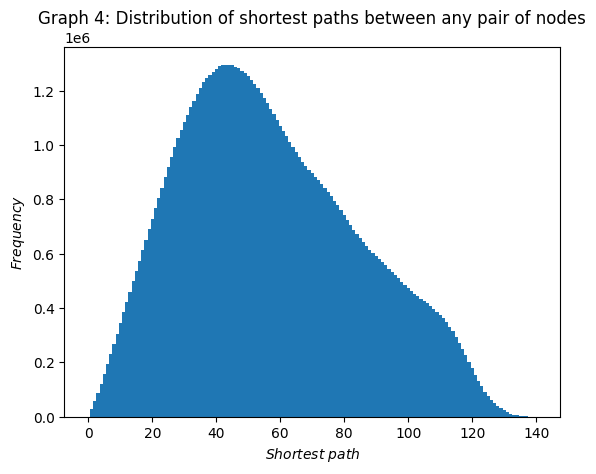

In [95]:
hist, bin_edges = gt.distance_histogram(u) #Intersection and streches of road
print(hist)
plt.bar(bin_edges[:-1], hist, width=1)
plt.title("Graph 4: Distribution of shortest paths between any pair of nodes")
plt.xlabel("$Shortest$ $path$")
plt.ylabel("$Frequency$")

In [100]:
average_path_length

(array([68.89329973, 67.89350977, 68.89329973, ..., 47.78607435,
        53.03245117, 54.08328082], dtype=float128),
 array([0.30725338, 0.30724851, 0.30725338, ..., 0.22325319, 0.27620925,
        0.25482873], dtype=float128))

In [97]:
dist = gt.shortest_distance(u)

average_path_length = gt.vertex_average(u, dist)
print(np.mean(average_path_length))

28.64611559718358794


In [91]:
gt.pseudo_diameter(u)

(138.0,
 (<Vertex object with index '3208' at 0x7bd7892552a0>,
  <Vertex object with index '9455' at 0x7bd789255930>))

### percolation threshold

Text(0.5, 0, '$Number$ $of$ $edges$')

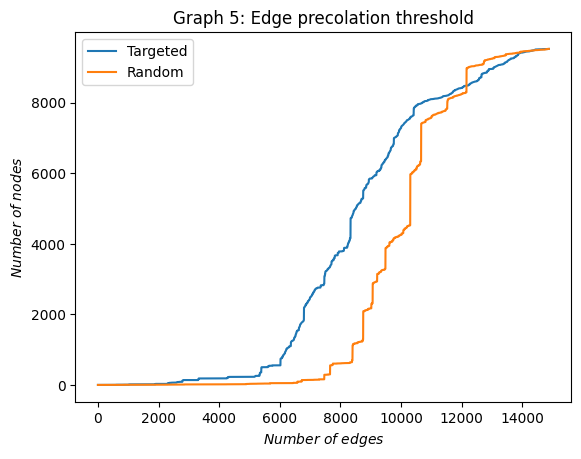

In [113]:
edges = sorted([(e.source(), e.target()) for e in u.edges()],
               key=lambda e: e[0].out_degree() * e[1].out_degree())

sizes, comp = gt.edge_percolation(u, edges)

np.random.shuffle(edges)

sizes2, comp = gt.edge_percolation(u, edges)

plt.plot(sizes, label="Targeted")

plt.plot(sizes2, label="Random")

plt.legend()

plt.title("Graph 5: Edge precolation threshold")
plt.ylabel("$Number$ $of$ $nodes$")
plt.xlabel("$Number$ $of$ $edges$")

### centrality measures

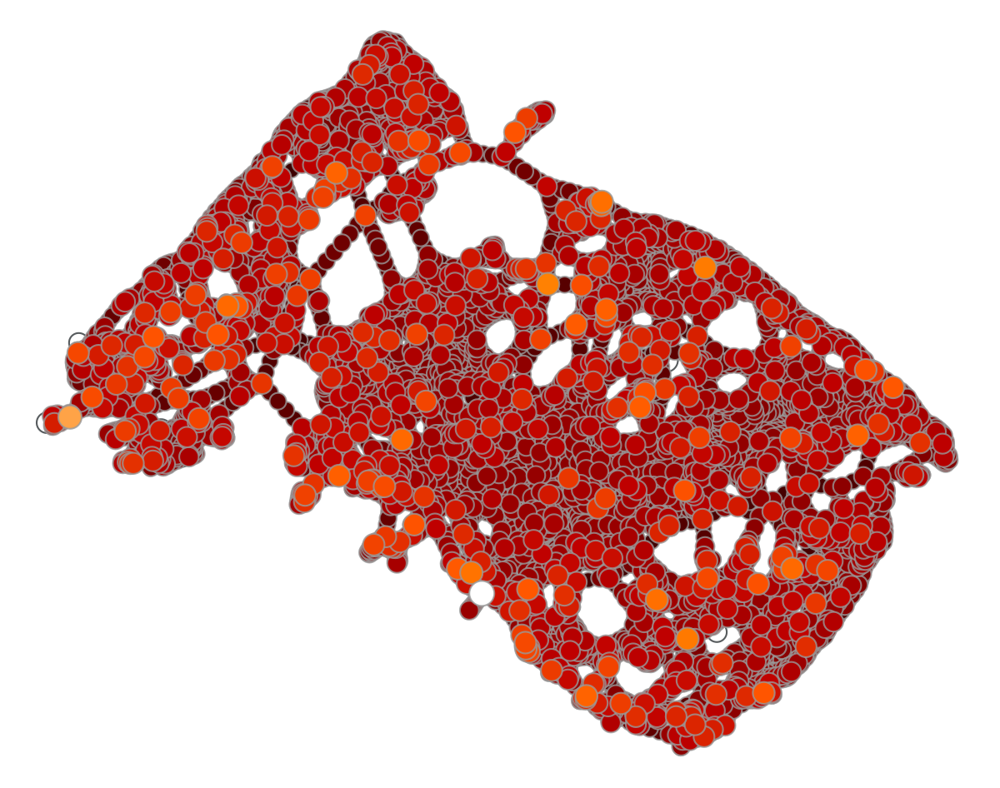

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7c65d0dc0b80, at 0x7c65caf34340>

In [212]:
pr = gt.pagerank(u)

gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=pr,

              vertex_size=gt.prop_to_size(pr, mi=5, ma=15),

              vorder=pr, vcmap=matplotlib.cm.gist_heat)

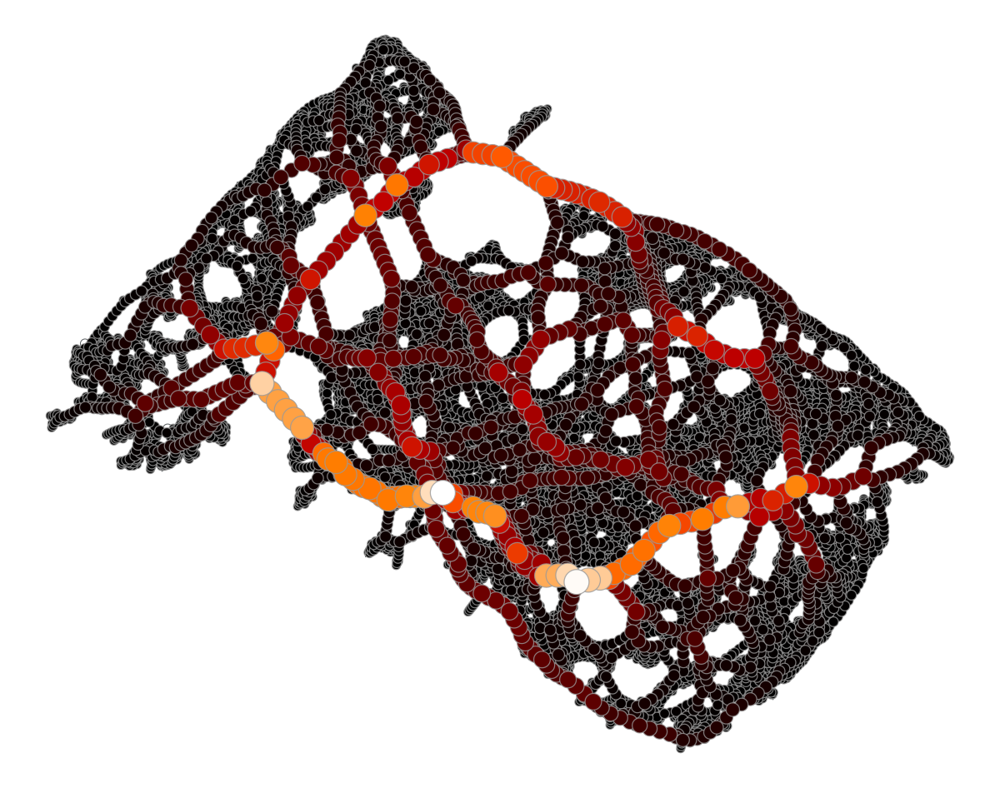

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7c65d0dc0b80, at 0x7c6607a77fd0>

In [213]:
vp, ep = gt.betweenness(u)

gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=vp,

              vertex_size=gt.prop_to_size(vp, mi=5, ma=15),

              edge_pen_width=gt.prop_to_size(ep, mi=0.5, ma=5),

              vcmap=matplotlib.cm.gist_heat,

              vorder=vp)

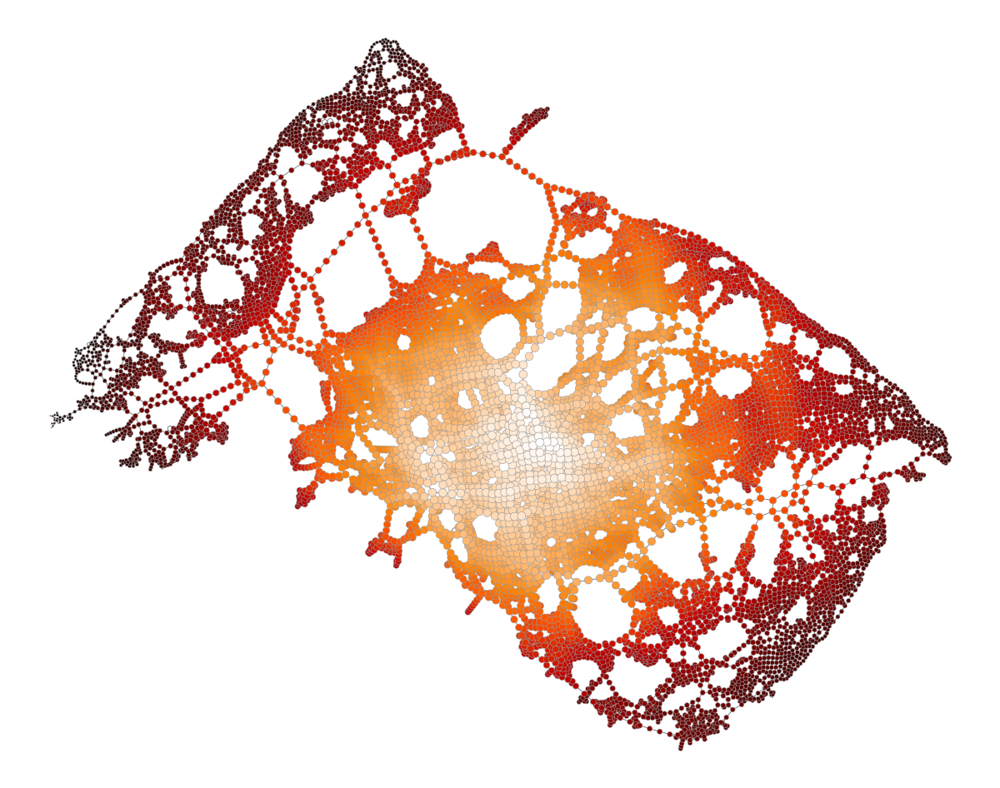

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7c65d0dc0b80, at 0x7c65e097b490>

In [214]:
c = gt.closeness(u)

gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=c,

              vertex_size=gt.prop_to_size(c, mi=0.5, ma=5),

              vcmap=matplotlib.cm.gist_heat,

              vorder=c)

In [120]:
clust = gt.local_clustering(u, undirected = True)

print(gt.vertex_average(u, clust))

(0.03901141216831198, 0.0010695646540200626)


In [121]:
print(clust.a)

[0.         0.         0.         ... 0.         0.33333333 0.        ]


In [122]:
total_degs = u.get_total_degrees(u.get_vertices())

Text(0.5, 0, '$k$')

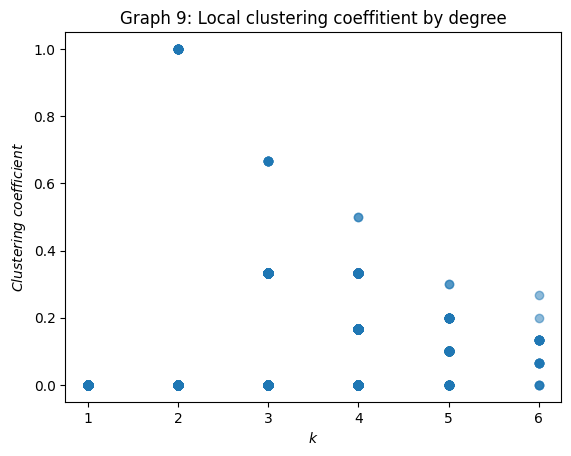

In [132]:
plt.scatter(total_degs, clust.a, alpha=0.5)
plt.title("Graph 9: Local clustering coeffitient by degree")
plt.ylabel("$Clustering$ $coefficient$")
plt.xlabel("$k$")

### Blockmodel

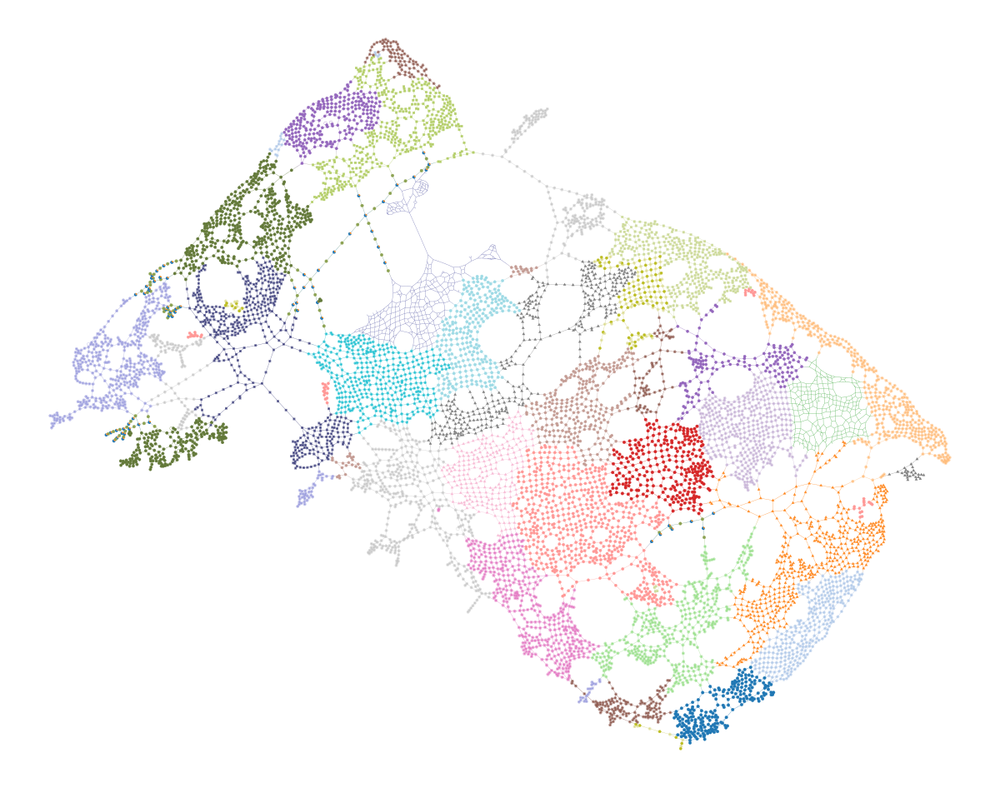

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7bd787e24ac0, at 0x7bd787c48c40>

In [140]:
state = gt.minimize_blockmodel_dl(u)
state.draw(pos=u.vp["_pos"], vertex_shape=state.get_blocks())

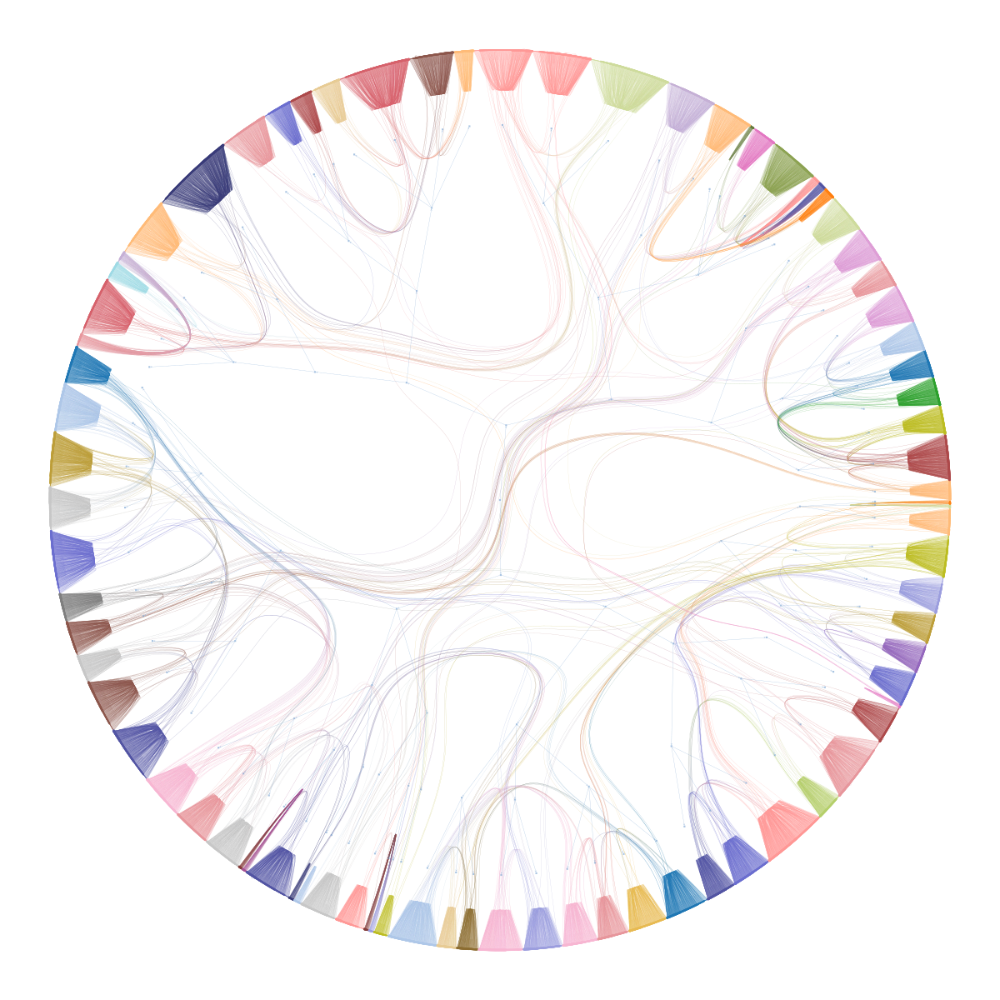

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7bd787e24ac0, at 0x7bd7872e2260>,
 <GraphView object, directed, with 9648 vertices and 9647 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x7bd78969c820, at 0x7bd78927e440>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x7bd78969c820, at 0x7bd78927ebc0>, False), at 0x7bd78969c820>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7bd78969c820, at 0x7bd78927fe20>)

In [141]:
state2 = gt.minimize_nested_blockmodel_dl(u) #small world between neighbourhoods

state2.draw()

In [225]:
 print(state.get_blocks().a)

[1306 1306 1306 ... 3129 4778 4778]
